In [1]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm  # colormaps 
                                        
%matplotlib inline

In [2]:
import seaborn as sns
import numpy as np
from statistics import mean
from math import ceil, sin, cos, radians
from collections import OrderedDict
import os
import pandas as pd
from pprint import pprint
from copy import deepcopy

In [3]:
import torch
import torchvision

In [4]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [5]:
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    print('device', device)
else:
    device = torch.device("cpu")
    print('device', device)

device cuda:0


In [6]:
from moe_em_model import moe_em_model
from moe_expectation_model import moe_expectation_model
from moe_pre_softmax_expectation_model import moe_pre_softmax_expectation_model
from moe_stochastic_model import moe_stochastic_model, moe_stochastic_loss
from moe_models import cross_entropy_loss

device cuda:0
device cuda:0
device cuda:0
device cuda:0
device cuda:0


In [7]:
import data_generator
from experts_gates import escort

device cuda:0


### Generate dataset for training

In [8]:
fig_path = 'nips2021/figures'
model_path = 'nips2021/results'

In [9]:
palette = ['tab:purple', 'tab:green', 'tab:orange','tab:pink', 'tab:olive','tab:brown', 'tab:cyan']

In [10]:
def plot_data(X, y, num_classes, dataset, path):
    f, ax = plt.subplots(nrows=1, ncols=1,figsize=(8,8))
    sns.scatterplot(x=X[:,0],y=X[:,1],hue=y,palette=palette[0:num_classes], ax=ax)
    ax.set_title("2D 3 classes Generated Data")
    plt.ylabel('Dim 2')
    plt.xlabel('Dim 1')
    plt.savefig(os.path.join(path, dataset+'_'+str(num_classes)+'.png'))

In [11]:
dataset = 'multi_class_pre_trained_linear_expert_gate'

NUM CLASSES 6
4058803790
2400 600
2400 600


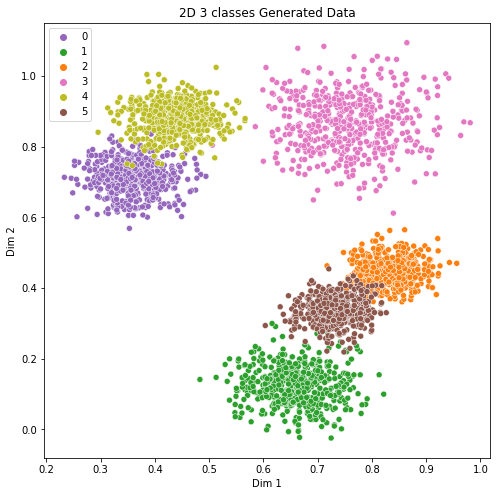

In [12]:
X, y, trainset, trainloader, testset, testloader, num_classes = data_generator.generate_data(dataset, 3000,32,6)
plot_data(X, y, num_classes, dataset, fig_path)
print(len(trainset), len(testset))

In [13]:
x_train = trainset[:][0]
y_train = trainset[:][1]
x_test = testset[:][0]
y_test = testset[:][1]

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
dataset = 'multi_class'
X_data = []
y_data = []
for num_classes, class_sep, label_shift in zip([2,2,1], [1,1,3], [0,2,4]):
    X,y = make_classification(n_samples=600*num_classes, n_features=2, n_informative=2, 
                              n_redundant=0, n_repeated=0, n_classes=num_classes, 
                              n_clusters_per_class=1,class_sep=class_sep,flip_y=0,
                              random_state=np.random.randint(20))
    X = X+np.random.uniform(0,1)
#     plot_data(X, y, num_classes, dataset, fig_path)
    X_data.append(X)
    y_data.append(y+label_shift)
X = np.concatenate(X_data)
y = np.concatenate(y_data)
print(X.shape)
print(y.shape)
print(np.unique(y))
plot_data(X, y, 5, dataset, fig_path)

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

batchsize = 32

# Create trainloader

trainset = torch.utils.data.TensorDataset(torch.tensor(x_train, dtype=torch.float32), 
                                          torch.tensor(y_train, dtype=torch.long))
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batchsize,
                                          shuffle=True, num_workers=1, pin_memory=True)
testset = torch.utils.data.TensorDataset(torch.tensor(x_test, dtype=torch.float32),
                                         torch.tensor(y_test, dtype=torch.long))
testloader = torch.utils.data.DataLoader(testset, batch_size=len(testset),
                                         shuffle=True, num_workers=1, pin_memory=True)
num_classes = 5

### Networks and callbacks

In [14]:
total_experts = 3

In [15]:
# fill = 'fixed'
# fill = 'fixed'
fill = 'rand'
fill = 'rand'

In [16]:
expert_weights_init = []
expert_bias_init = []
for i in range(total_experts):
    weights = torch.zeros(num_classes,2)
    torch.nn.init.uniform_(weights)
    expert_weights_init.append(weights)
    bias = torch.zeros(num_classes)
    torch.nn.init.uniform_(bias)
    expert_bias_init.append(bias)
    print('expert '+str(i)+' weight ', weights)
    print('expert '+str(i)+' bias ', bias)

expert 0 weight  tensor([[0.3783, 0.1871],
        [0.9531, 0.0299],
        [0.6225, 0.5350],
        [0.3130, 0.8253],
        [0.2431, 0.2035],
        [0.0048, 0.2994]])
expert 0 bias  tensor([0.6355, 0.9709, 0.6068, 0.7703, 0.1694, 0.3685])
expert 1 weight  tensor([[0.8800, 0.8933],
        [0.8285, 0.3284],
        [0.2293, 0.3151],
        [0.1755, 0.1206],
        [0.8880, 0.3866],
        [0.4362, 0.1919]])
expert 1 bias  tensor([0.7071, 0.3145, 0.8097, 0.0762, 0.7213, 0.8342])
expert 2 weight  tensor([[0.5421, 0.8010],
        [0.2204, 0.7591],
        [0.8042, 0.3242],
        [0.0081, 0.6488],
        [0.1649, 0.3639],
        [0.5926, 0.5603]])
expert 2 bias  tensor([0.9977, 0.2783, 0.2326, 0.8746, 0.3318, 0.2662])


In [17]:
gate_weights_init = torch.zeros(total_experts,2)
torch.nn.init.uniform_(gate_weights_init)
print('gate weights ', gate_weights_init)
gate_bias_init = torch.zeros(3)
torch.nn.init.uniform_(gate_bias_init)
print('gate_bias', gate_bias_init)

gate weights  tensor([[0.4328, 0.3698],
        [0.3612, 0.9871],
        [0.1300, 0.0145]])
gate_bias tensor([0.4254, 0.0720, 0.5593])


In [18]:
gate_weights_init = [torch.zeros(16,2),torch.zeros(total_experts, 16)]
gate_weights_init = [torch.nn.init.uniform_(gate_weights_init[i]) for i in range(2)]
print('gate weights ', gate_weights_init)
gate_bias_init = [torch.zeros(16), torch.zeros(total_experts)]
gate_bias_init =[torch.nn.init.uniform_(gate_bias_init[i]) for i in range(2)]
print('gate_bias', gate_bias_init)

gate weights  [tensor([[0.5323, 0.8156],
        [0.6450, 0.3997],
        [0.3066, 0.6565],
        [0.0476, 0.8530],
        [0.1836, 0.5746],
        [0.6239, 0.2627],
        [0.1504, 0.7891],
        [0.0426, 0.8586],
        [0.0576, 0.6471],
        [0.7388, 0.3212],
        [0.4582, 0.7876],
        [0.0421, 0.9036],
        [0.7622, 0.9882],
        [0.3609, 0.2785],
        [0.0419, 0.8050],
        [0.9700, 0.2346]]), tensor([[0.7021, 0.4162, 0.3266, 0.3821, 0.3670, 0.2442, 0.8449, 0.3164, 0.1850,
         0.6136, 0.1039, 0.9594, 0.2879, 0.7360, 0.0890, 0.2748],
        [0.3309, 0.4157, 0.6154, 0.7442, 0.3774, 0.2979, 0.4554, 0.6548, 0.5862,
         0.9006, 0.1922, 0.8504, 0.5577, 0.3221, 0.5652, 0.6567],
        [0.8170, 0.5676, 0.0470, 0.9540, 0.9122, 0.1519, 0.4912, 0.7262, 0.0612,
         0.1877, 0.8392, 0.0234, 0.5585, 0.6963, 0.7434, 0.1281]])]
gate_bias [tensor([0.6497, 0.0699, 0.1117, 0.6419, 0.1223, 0.1230, 0.6525, 0.2646, 0.6653,
        0.3377, 0.2528, 0.2062, 0

In [19]:
expert_weights_init = [None]*total_experts
expert_bias_init = [None]*total_experts
gate_weights_init = None
gate_bias_init = None

In [20]:
#Expert network
class expert_layers(nn.Module):
    def __init__(self, masks,num_classes, output, fill='rand', fill_w=None, fill_b=None):
        super(expert_layers, self).__init__()
        linear_1 = nn.Linear(2,output)
        if not fill == 'rand':
            linear_1.weight.data = fill_w
            linear_1.bias.data = fill_b
        self.model = nn.Sequential(OrderedDict({
                    'linear_1':linear_1,
                    'softmax': nn.Softmax(dim=1)
                    })
                ) 
        self.masks = masks
        self.output = output
        self.num_classes = num_classes
        
    def forward(self, input):
        output = self.model(input)
        if not self.masks is None:
            mask = torch.zeros(output.shape[0],self.num_classes)
            for m, i in zip(self.masks, range(self.output)):
                mask[:,m] = output[:,i] 
            return mask.to(device)
        return output


In [21]:
#Expert network
class expert_layers_presoftmax(nn.Module):
    def __init__(self, masks, num_classes, output, fill='rand', fill_w=None, fill_b=None):
        super(expert_layers_presoftmax, self).__init__()
        linear_1 = nn.Linear(2,output)
        if not fill == 'rand':
            linear_1.weight.data = fill_w
            linear_1.bias.data = fill_b
        self.model = nn.Sequential(OrderedDict({
                    'linear_1':linear_1
                    })
                ) 
        self.masks = masks
        self.output = output
        self.num_classes = num_classes
        
    def forward(self, input):
        output = self.model(input)
        if not self.masks is None:
            mask = torch.zeros(output.shape[0],self.num_classes)
            for m, i in zip(self.masks, range(self.output)):
                mask[:,m] = output[:,i] 
            return mask.to(device)
        return output

In [22]:
# create a set of experts
def experts(num_experts, masks, total_num_classes, num_classes, expert_layers_type=expert_layers):
    models = []
    for i in range(num_experts):
        models.append(expert_layers_type(masks[i], total_num_classes, num_classes[i], 
                                         fill=fill, fill_w=expert_weights_init[i], fill_b=expert_bias_init[i]))
    return nn.ModuleList(models)

In [23]:
#Gate network (Similar to the expert layer)
class gate_layers(nn.Module):
    def __init__(self, num_classes, num_experts, fill='rand', fill_w=None, fill_b=None):
        super(gate_layers, self).__init__()
        linear_1 = nn.Linear(2,num_experts)
        if not fill == 'rand':
            linear_1.weight.data = fill_w
            linear_1.bias.data = fill_b
        self.model = nn.Sequential(OrderedDict({
                    'linear_1':linear_1
                    })
                )
    def forward(self, inputs, T=1.0):
        t = self.model(inputs)
        return F.softmax(t/T, dim=1)

### Mixture of experts model

In [24]:
# compute
def accuracy(out, yb, mean=True):
    preds = torch.argmax(out, dim=1).to(device)
    if mean:
        return (preds == yb).float().mean()
    else:
        return (preds == yb).float()

In [25]:
num_epochs = 30

In [26]:
def train(trainloader, testloader, model, optimizer, loss_criterion, epochs, pre_softmax=False):
    for epoch in range(epochs):
        running_accuracy = 0.0
        num_batches = 0
        test_accuracy = 0.0
        for inputs, labels in trainloader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            if pre_softmax:
                outputs = F.softmax(outputs, dim=1)
            outputs = outputs.to(device)
            loss = loss_criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_accuracy += accuracy(outputs, labels)
            num_batches+=1
            
        test_batches = 0
        for inputs, labels in testloader:
            inputs, labels = inputs.to(device), labels.to(device)
            test_outputs = model(inputs)
                
            if pre_softmax:
                test_outputs = F.softmax(test_outputs, dim=1)
            test_outputs = test_outputs.to(device)
            test_accuracy += accuracy(test_outputs, labels)
            test_batches += 1
            
        with torch.no_grad():
            running_accuracy = running_accuracy.cpu().numpy()/num_batches
            test_accuracy = test_accuracy.cpu().numpy()/test_batches
            print('epoch %d' % epoch,
                  ' train accuracy %.2f' % running_accuracy, 
                  'val accuracy %.2f' % test_accuracy)

In [27]:
classes_per_expert = [[0,4], [1,5], [2,3]]
class_expert_map = {0:0,1:1,2:2,3:2,4:0,5:1}

In [28]:
classes_per_expert = [[0,1], [2,3], [4,5]]
class_expert_map = {0:0,1:0,2:1,3:1,4:2,5:2}

In [29]:
classes_per_expert_str = ''
for labels in classes_per_expert:
    buffer = "_".join(str(labels).replace('[','').replace(']','').replace(',','_').replace(" ",'')).replace('_','')
    classes_per_expert_str += buffer+'_'
classes_per_expert_str = classes_per_expert_str.strip('_')
classes_per_expert_str

'01_23_45'

In [30]:
# experiment with models with different number of experts
w_importance=0.0
w_ortho = 0.0
w_ideal_gate = 0.0

augment = False
attention = False
T_max = 1
#T_decay = T_max/num_epochs
#T_decay = T_max/(num_epochs - T_decay_start)
T_decay = 0
T_decay_start = 0

def generate_plot_file(dataset, specific):
    plot_file = dataset
    if T_decay > 0:
        plot_file += '_Tdecay_'+str(T_decay)
    if T_decay_start > 0:
        plot_file += '_Tdecaystart_'+str(T_decay_start)
    if w_importance > 0:
        plot_file += '_importance_'+str(w_importance)
    if w_ortho > 0:
        plot_file += '_ortho_'+str(w_ortho)
    if augment:
        plot_file += '_augment'
    if attention:
        plot_file += '_attention'
    plot_file += '_'+str(fill)
    plot_file += '_'+specific
    
    return plot_file


In [31]:
def train_experts(total_experts, total_num_classes, num_classes, x_train, y_train, x_test, y_test,pre_softmax=False):
    batchsize = 32
    if pre_softmax:
        expert_models_copy = experts(total_experts,
                                classes_per_expert, total_num_classes, 
                                num_classes, expert_layers_presoftmax)
    else:
        expert_models_copy = experts(total_experts, 
                                classes_per_expert, total_num_classes, 
                                num_classes)
        
    expert_models = deepcopy(expert_models_copy)
    expert_models = expert_models.to(device)

    for classes, exp_i in zip(classes_per_expert, range(0,total_experts)):
                    
        index_0_1 = torch.tensor([])
        for label in classes:
            index_0_1 = np.concatenate([np.where(y_train==label)[0], index_0_1])
        
        x_0_1_train = x_train[index_0_1]
        y_0_1_train = y_train[index_0_1]

        print('train labels', np.unique(y_0_1_train))
        trainset_0_1 = torch.utils.data.TensorDataset(x_0_1_train, 
                                                      y_0_1_train)
        trainloader_0_1 = torch.utils.data.DataLoader(trainset_0_1, batch_size=batchsize,
                                                      shuffle=True, num_workers=1, pin_memory=True)
        
        index_0_1 = torch.tensor([])
        for label in classes:
            index_0_1 = np.concatenate([np.where(y_test==label)[0], index_0_1])
            
        x_0_1_test = x_test[index_0_1]
        y_0_1_test = y_test[index_0_1]
        
        print('test labels', np.unique(y_0_1_test))
        testset_0_1 = torch.utils.data.TensorDataset(x_0_1_test, 
                                                      y_0_1_test)
        testloader_0_1 = torch.utils.data.DataLoader(testset_0_1, batch_size=len(testset_0_1),
                                                  shuffle=True, num_workers=1, pin_memory=True)

        optimizer_expert = optim.RMSprop(expert_models[exp_i].parameters(), lr=0.01, momentum=0.9)

        
        loss_c = cross_entropy_loss().to(device)
        train(trainloader_0_1, testloader_0_1, expert_models[exp_i], optimizer_expert, loss_c, 20, pre_softmax)
    for i in range(0,total_experts):
        for param in expert_models[i].parameters():
            param.requires_grad = False
    return expert_models, expert_models_copy

In [32]:
expert_models, expert_models_copy = train_experts(total_experts,num_classes, [2,2,2], x_train, y_train, x_test, y_test)

train labels [0 1]
test labels [0 1]
epoch 0  train accuracy 0.98 val accuracy 1.00
epoch 1  train accuracy 1.00 val accuracy 1.00
epoch 2  train accuracy 1.00 val accuracy 1.00
epoch 3  train accuracy 1.00 val accuracy 1.00
epoch 4  train accuracy 1.00 val accuracy 1.00
epoch 5  train accuracy 1.00 val accuracy 1.00
epoch 6  train accuracy 1.00 val accuracy 1.00
epoch 7  train accuracy 1.00 val accuracy 1.00
epoch 8  train accuracy 1.00 val accuracy 1.00
epoch 9  train accuracy 1.00 val accuracy 1.00
epoch 10  train accuracy 1.00 val accuracy 1.00
epoch 11  train accuracy 1.00 val accuracy 1.00
epoch 12  train accuracy 1.00 val accuracy 1.00
epoch 13  train accuracy 1.00 val accuracy 1.00
epoch 14  train accuracy 1.00 val accuracy 1.00
epoch 15  train accuracy 1.00 val accuracy 1.00
epoch 16  train accuracy 1.00 val accuracy 1.00
epoch 17  train accuracy 1.00 val accuracy 1.00
epoch 18  train accuracy 1.00 val accuracy 1.00
epoch 19  train accuracy 1.00 val accuracy 1.00
train labels 

In [33]:
plot_file = generate_plot_file(dataset, str(num_classes)+'_'+str(total_experts)+'_'+classes_per_expert_str+'_expert_model.pt')

In [34]:
torch.save([expert_models, expert_models_copy], open(os.path.join(model_path, plot_file),'wb'))

In [35]:
expert_models, expert_models_copy = torch.load(os.path.join(model_path, plot_file))

In [36]:
expert_presoftmax_models, expert_presoftmax_models_copy = train_experts(total_experts, num_classes, [2,2,2], x_train, y_train, x_test, y_test, True)

train labels [0 1]
test labels [0 1]
epoch 0  train accuracy 0.92 val accuracy 1.00
epoch 1  train accuracy 1.00 val accuracy 1.00
epoch 2  train accuracy 1.00 val accuracy 1.00
epoch 3  train accuracy 1.00 val accuracy 1.00
epoch 4  train accuracy 1.00 val accuracy 1.00
epoch 5  train accuracy 1.00 val accuracy 1.00
epoch 6  train accuracy 1.00 val accuracy 1.00
epoch 7  train accuracy 1.00 val accuracy 1.00
epoch 8  train accuracy 1.00 val accuracy 1.00
epoch 9  train accuracy 1.00 val accuracy 1.00
epoch 10  train accuracy 1.00 val accuracy 1.00
epoch 11  train accuracy 1.00 val accuracy 1.00
epoch 12  train accuracy 1.00 val accuracy 1.00
epoch 13  train accuracy 1.00 val accuracy 1.00
epoch 14  train accuracy 1.00 val accuracy 1.00
epoch 15  train accuracy 1.00 val accuracy 1.00
epoch 16  train accuracy 1.00 val accuracy 1.00
epoch 17  train accuracy 1.00 val accuracy 1.00
epoch 18  train accuracy 1.00 val accuracy 1.00
epoch 19  train accuracy 1.00 val accuracy 1.00
train labels 

In [37]:
plot_file = generate_plot_file(dataset, str(num_classes)+'_'+str(total_experts)+'_'+classes_per_expert_str+'_expert_presoftmax_model.pt')

In [38]:
torch.save([expert_presoftmax_models,expert_presoftmax_models_copy],open(os.path.join(model_path, plot_file),'wb'))

In [39]:
expert_presoftmax_models, expert_presoftmax_models_copy = torch.load(os.path.join(model_path, plot_file))

In [67]:
for T in range(1, T_max+1):
    print('Temperature', T)
    models = {
            'moe_em_model':{'model':moe_em_model,'loss':cross_entropy_loss,'experts':{}},
            'moe_pre_softmax_expectation_model':{'model':moe_pre_softmax_expectation_model,'loss':cross_entropy_loss,'experts':{}},
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
            'moe_stochastic_model':{'model':moe_stochastic_model, 'loss':moe_stochastic_loss(cross_entropy_loss),'experts':{}}
         }

    for key, val in models.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                exp_models = expert_presoftmax_models
            else:
                exp_models = expert_models
            gate_model = gate_layers(num_classes, num_experts, fill,
                                    fill_w=gate_weights_init, fill_b=gate_bias_init)
            moe_model = val['model'](num_experts, num_classes, augment, attention, exp_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.001, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.001, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.001, momentum=0.9)

            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,
                                   w_importance, w_ortho,
                                   T=T, accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    
        

Temperature 1
Model: moe_em_model
Number of experts  3
model params: 63
step 0 training loss 0.08 , training accuracy 0.97 , test accuracy 1.00
step 1 training loss 0.07 , training accuracy 0.98 , test accuracy 1.00
step 2 training loss 0.07 , training accuracy 0.98 , test accuracy 0.97
step 3 training loss 0.07 , training accuracy 0.97 , test accuracy 1.00
step 4 training loss 0.07 , training accuracy 0.98 , test accuracy 0.97
step 5 training loss 0.07 , training accuracy 0.98 , test accuracy 1.00
step 6 training loss 0.07 , training accuracy 0.97 , test accuracy 1.00
step 7 training loss 0.07 , training accuracy 0.98 , test accuracy 0.94
step 8 training loss 0.07 , training accuracy 0.98 , test accuracy 1.00
step 9 training loss 0.07 , training accuracy 0.98 , test accuracy 0.91
step 10 training loss 0.07 , training accuracy 0.98 , test accuracy 1.00
step 11 training loss 0.07 , training accuracy 0.98 , test accuracy 0.94
step 12 training loss 0.07 , training accuracy 0.97 , test acc

In [40]:
dataset_1 = 'multi_class_linear_expert_gate'

In [69]:
for T in range(1, T_max+1):
    print('Temperature', T)
    models = {
            'moe_em_model':{'model':moe_em_model,'loss':cross_entropy_loss,'experts':{}},
            'moe_pre_softmax_expectation_model':{'model':moe_pre_softmax_expectation_model,'loss':cross_entropy_loss,'experts':{}},
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
            'moe_stochastic_model':{'model':moe_stochastic_model, 'loss':moe_stochastic_loss(cross_entropy_loss),'experts':{}}
         }
    for key, val in models.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts, expert_layers_presoftmax)
            else:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts)
            gate_model = gate_layers(num_classes, num_experts, fill,
                                     fill_w=gate_weights_init, fill_b=gate_bias_init)
            #plot_boundary_components(gate_model)
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_1, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    
        

Temperature 1
Model: moe_em_model
Number of experts  3
model params: 63
step 0 training loss 0.33 , training accuracy 0.63 , test accuracy 0.88
step 1 training loss 0.24 , training accuracy 0.75 , test accuracy 0.59
step 2 training loss 0.21 , training accuracy 0.87 , test accuracy 0.91
step 3 training loss 0.21 , training accuracy 0.89 , test accuracy 0.97
step 4 training loss 0.21 , training accuracy 0.93 , test accuracy 0.97
step 5 training loss 0.19 , training accuracy 0.90 , test accuracy 1.00
step 6 training loss 0.19 , training accuracy 0.94 , test accuracy 0.91
step 7 training loss 0.17 , training accuracy 0.97 , test accuracy 0.97
step 8 training loss 0.17 , training accuracy 0.97 , test accuracy 1.00
step 9 training loss 0.16 , training accuracy 0.97 , test accuracy 0.94
step 10 training loss 0.16 , training accuracy 0.96 , test accuracy 0.97
step 11 training loss 0.16 , training accuracy 0.96 , test accuracy 0.91
step 12 training loss 0.15 , training accuracy 0.96 , test acc

In [41]:
dataset_2 = 'multi_class_scratch_linear_expert_gate'
dataset_3 = 'multi_class_pre_trained_gate_scratch_same_wts_linear_expert_gate'
dataset_4 = 'multi_class_pre_trained_gate_scratch_rand_wts_linear_expert_gate'

In [59]:
for T in range(1, T_max+1):
    print('Temperature', T)
    models = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    
    models_gate_pretrained_same_wts = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    models_gate_pretrained_rand_wts = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    saved_experts = {}
    for key, val in models.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models_copy = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts, expert_layers_presoftmax)
            else:
                expert_models_copy = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts)
            
            saved_experts[key] = expert_models_copy
            
            expert_models = deepcopy(expert_models_copy)
            gate_model = gate_layers(num_classes, num_experts, fill,
                                     fill_w=gate_weights_init, fill_b=gate_bias_init)
            
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_2, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))  
    
    for key, val in models_gate_pretrained_same_wts.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)

            expert_models = deepcopy(saved_experts[key])

            gate_model = models[key]['experts'][num_experts]['model'].gate
            
            # Fix the gate parameters
            for param in gate_model.parameters():
                param.requires_grad = False
            
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_3, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    
    
    for key, val in models_gate_pretrained_rand_wts.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts, expert_layers_presoftmax)
            else:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts)
            
            for param in expert_models.parameters():
                print('rand', param)
                break

            gate_model = models[key]['experts'][num_experts]['model'].gate
            
            # Fix the gate parameters
            for param in gate_model.parameters():
                param.requires_grad = False
            
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_4, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))   

Temperature 1
Model: moe_expectation_model
Number of experts  3
model params: 63
epoch 0 training loss 0.97 , training accuracy 0.68 , test accuracy 0.84
epoch 1 training loss 0.60 , training accuracy 0.83 , test accuracy 0.80
epoch 2 training loss 0.49 , training accuracy 0.92 , test accuracy 0.96
epoch 3 training loss 0.43 , training accuracy 0.94 , test accuracy 0.96
epoch 4 training loss 0.38 , training accuracy 0.96 , test accuracy 0.97
epoch 5 training loss 0.34 , training accuracy 0.96 , test accuracy 0.94
epoch 6 training loss 0.31 , training accuracy 0.96 , test accuracy 0.97
epoch 7 training loss 0.29 , training accuracy 0.96 , test accuracy 0.96
epoch 8 training loss 0.26 , training accuracy 0.97 , test accuracy 0.96
epoch 9 training loss 0.24 , training accuracy 0.96 , test accuracy 0.94
epoch 10 training loss 0.23 , training accuracy 0.97 , test accuracy 0.98
epoch 11 training loss 0.21 , training accuracy 0.97 , test accuracy 0.97
epoch 12 training loss 0.20 , training ac

In [62]:
#Gate network (Similar to the expert layer)
class gate_nonlinear_layers(nn.Module):
    def __init__(self, num_classes, num_experts, fill='rand', fill_w=None, fill_b=None):
        super(gate_nonlinear_layers, self).__init__()
        linear_1 = nn.Linear(2,16)
        linear_2 = nn.Linear(16, num_experts)

        if not fill == 'rand':
            linear_1.weight.data = fill_w[0]
            linear_1.bias.data = fill_b[0]
            linear_2.weight.data = fill_w[1]
            linear_2.bias.data = fill_b[1]
        self.model = nn.Sequential(OrderedDict({
                    'linear_1':linear_1,
                    'relu':nn.ReLU(),
                    'linear_2':linear_2,
                    })
                )
    def forward(self, input, T=1.0):
        t = self.model(input)
        return F.softmax(t/T, dim=1)

In [63]:
dataset_5 = 'multi_class_scratch_linear_expert_nonlinear_gate'
dataset_6 = 'multi_class_pre_trained_gate_scratch_same_wts_linear_expert_nonlinear_gate'
dataset_7 = 'multi_class_pre_trained_gate_scratch_rand_wts_linear_expert_nonlinear_gate'

In [64]:
for T in range(1, T_max+1):
    print('Temperature', T)
    models = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    
    models_gate_pretrained_same_wts = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    models_gate_pretrained_rand_wts = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    saved_experts = {}
    for key, val in models.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models_copy = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts, expert_layers_presoftmax)
            else:
                expert_models_copy = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts)
            
            saved_experts[key] = expert_models_copy
            
            expert_models = deepcopy(expert_models_copy)
            gate_model = gate_nonlinear_layers(num_classes, num_experts, fill,
                                     fill_w=gate_weights_init, fill_b=gate_bias_init)
                        
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_5, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))  
    
    for key, val in models_gate_pretrained_same_wts.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)

            expert_models = deepcopy(saved_experts[key])
            gate_model = models[key]['experts'][num_experts]['model'].gate
            
            # Fix the gate parameters
            for param in gate_model.parameters():
                param.requires_grad = False
            
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_6, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    
    
    for key, val in models_gate_pretrained_rand_wts.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts, expert_layers_presoftmax)
            else:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts)
            
            gate_model = models[key]['experts'][num_experts]['model'].gate
            
            # Fix the gate parameters
            for param in gate_model.parameters():
                param.requires_grad = False
            
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_7, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))   

Temperature 1
Model: moe_expectation_model
Number of experts  3
model params: 153
epoch 0 training loss 0.96 , training accuracy 0.65 , test accuracy 0.75
epoch 1 training loss 0.56 , training accuracy 0.86 , test accuracy 0.94
epoch 2 training loss 0.46 , training accuracy 0.92 , test accuracy 0.95
epoch 3 training loss 0.40 , training accuracy 0.96 , test accuracy 0.97
epoch 4 training loss 0.35 , training accuracy 0.96 , test accuracy 0.96
epoch 5 training loss 0.33 , training accuracy 0.96 , test accuracy 0.97
epoch 6 training loss 0.29 , training accuracy 0.97 , test accuracy 0.96
epoch 7 training loss 0.26 , training accuracy 0.97 , test accuracy 0.95
epoch 8 training loss 0.24 , training accuracy 0.97 , test accuracy 0.97
epoch 9 training loss 0.24 , training accuracy 0.96 , test accuracy 0.94
epoch 10 training loss 0.21 , training accuracy 0.97 , test accuracy 0.95
epoch 11 training loss 0.21 , training accuracy 0.97 , test accuracy 0.97
epoch 12 training loss 0.19 , training a

In [51]:
plot_file = generate_plot_file(dataset_2, 'T_'+str(T_max)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
models_random = torch.load(open(os.path.join(model_path, plot_file),'rb'))

In [52]:
plot_file = generate_plot_file(dataset, 'T_'+str(T_max)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
models_pre_trained = torch.load(open(os.path.join(model_path, plot_file),'rb'))

In [47]:
plot_file = generate_plot_file(dataset, str(num_classes)+'_'+str(total_experts)+'_'+classes_per_expert_str+'_expert_model.pt')

In [48]:
expert_models, expert_models_copy = torch.load(os.path.join(model_path, plot_file))

In [46]:
dataset_8 = 'multi_class_pre_trained_gate_prechosen_linear_expert_gate'
dataset_9 = 'multi_class_pre_trained_gate_prechosen_same_wts_linear_expert_gate'
dataset_10 = 'multi_class_pre_trained_gate_prechosen_rand_wts_linear_expert_gate'

In [51]:
for T in range(1, T_max+1):
    print('Temperature', T)
    models = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    models_gate_pretrained_same_wts = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    models_gate_pretrained_rand_wts = {
            'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}},
         }
    for key, val in models.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)

            expert_models = expert_models

            gate_model = gate_layers(num_classes, num_experts, fill,
                                     fill_w=gate_weights_init, fill_b=gate_bias_init)
             
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_8, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    

    for key, val in models_gate_pretrained_same_wts.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            
            expert_models = expert_models_copy
            
            gate_model = models[key]['experts'][num_experts]['model'].gate
            # Fix the gate parameters
            for param in gate_model.parameters():
                param.requires_grad = False
                
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_9, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    

    for key, val in models_gate_pretrained_rand_wts.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts, expert_layers_presoftmax)
            else:
                expert_models = experts(num_experts, [None]*num_experts, num_classes, [num_classes]*num_experts)
            
            gate_model = models[key]['experts'][num_experts]['model'].gate
            # Fix the gate parameters
            for param in gate_model.parameters():
                param.requires_grad = False
                
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)
            
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset_10, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(num_experts)+'_model.pt')
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))    
        

Temperature 1
Model: moe_expectation_model
Number of experts  3
model params: 27
epoch 0 training loss 0.87 , training accuracy 0.63 , test accuracy 0.69
epoch 1 training loss 0.65 , training accuracy 0.79 , test accuracy 0.86
epoch 2 training loss 0.57 , training accuracy 0.87 , test accuracy 0.90
epoch 3 training loss 0.51 , training accuracy 0.88 , test accuracy 0.91
epoch 4 training loss 0.47 , training accuracy 0.90 , test accuracy 0.93
epoch 5 training loss 0.43 , training accuracy 0.90 , test accuracy 0.95
epoch 6 training loss 0.40 , training accuracy 0.92 , test accuracy 0.94
epoch 7 training loss 0.38 , training accuracy 0.94 , test accuracy 0.90
epoch 8 training loss 0.36 , training accuracy 0.94 , test accuracy 0.92
epoch 9 training loss 0.34 , training accuracy 0.94 , test accuracy 0.95
epoch 10 training loss 0.32 , training accuracy 0.95 , test accuracy 0.93
epoch 11 training loss 0.31 , training accuracy 0.95 , test accuracy 0.95
epoch 12 training loss 0.30 , training ac

In [62]:
plot_file = generate_plot_file(dataset_2, 'T_'+str(T_max)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
models_random = torch.load(open(os.path.join(model_path, plot_file),'rb'))

In [63]:
plot_file = generate_plot_file(dataset, 'T_'+str(T_max)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
models_pre_trained = torch.load(open(os.path.join(model_path, plot_file),'rb'))

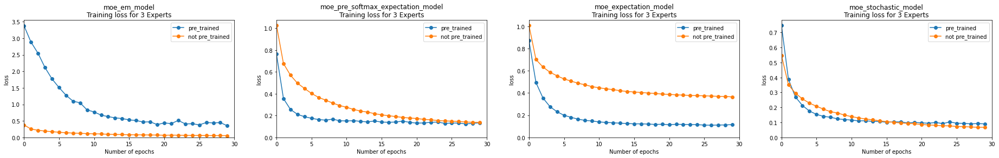

In [64]:
fig,ax = plt.subplots(1, 4, sharex=False, sharey=False, figsize=(32,4))
index = 0
for m_pt, m in zip(models_pre_trained.items(), models_random.items()):
    mkey_pt, mval_pt = m_pt
    mkey, mval = m
    for i in range(total_experts, total_experts+1):
        history = mval['experts'][i]['history']
        history_pt = mval_pt['experts'][i]['history']
        legend_labels = ['pre_trained', 'not pre_trained']
        ax[index].plot(range(num_epochs), history_pt['loss'], marker='o',color='tab:blue')
        ax[index].plot(range(num_epochs), history['loss'], marker='o', color='tab:orange')   
        ax[index].set_ylim(bottom=0)
        ax[index].set_title(mkey+'\n'+'Training loss for ' + str(i) + ' Experts')
        ax[index].legend(legend_labels)
        ax[index].set_xlabel('Number of epochs')
        ax[index].set_xlim(0, num_epochs)
        ax[index].set_ylabel('loss')
    index+=1

image_file = generate_plot_file(dataset_3, classes_per_expert_str+'_loss_compare_T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
plt.savefig(os.path.join(fig_path, image_file))

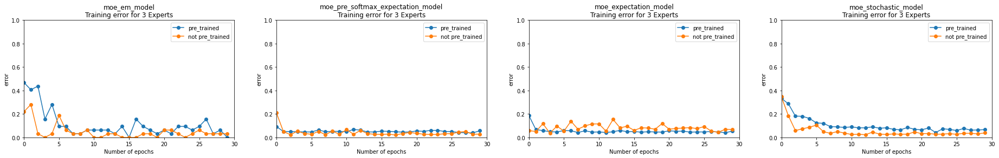

In [65]:
fig,ax = plt.subplots(1, 4, sharex=False, sharey=False, figsize=(32,4))
index = 0
for m_pt, m in zip(models_pre_trained.items(), models_random.items()):
    mkey_pt, mval_pt = m_pt
    mkey, mval = m
    for i in range(total_experts, total_experts+1):

        history = mval['experts'][i]['history']
        history_pt = mval_pt['experts'][i]['history']
        legend_labels = ['pre_trained', 'not pre_trained']
        ax[index].plot(range(num_epochs), 1-torch.tensor(history_pt['val_accuracy']), marker='o',color='tab:blue')
        ax[index].plot(range(num_epochs), 1-torch.tensor(history['val_accuracy']), marker='o', color='tab:orange')            
        ax[index].set_ylim(0,1)
        ax[index].set_title(mkey+'\n'+'Training error for ' + str(i) + ' Experts')
        ax[index].legend(legend_labels)
        ax[index].set_xlabel('Number of epochs')
        ax[index].set_xlim(0, num_epochs)
        ax[index].set_ylabel('error')
    index+=1
image_file = generate_plot_file(dataset_3, classes_per_expert_str+'_error_compare_T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
plt.savefig(os.path.join(fig_path, image_file))

model:  multi_class_linear_expert_gate_importance_1.0_rand_T_1_6_3_model.pt


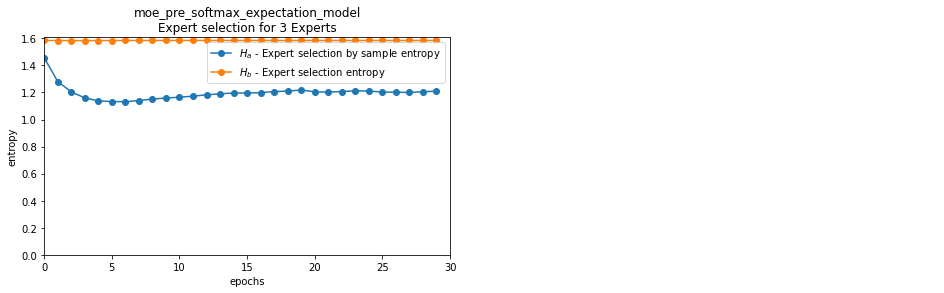

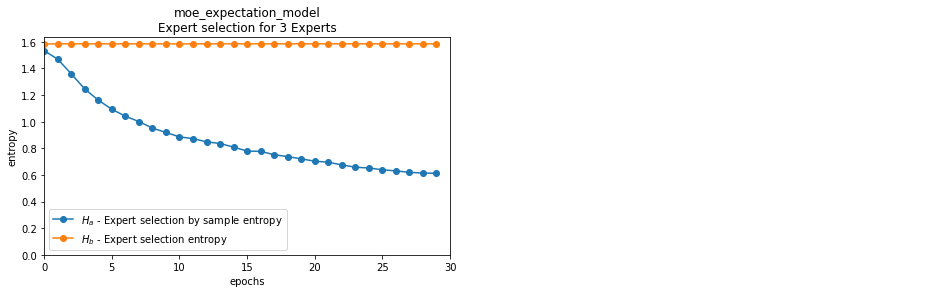

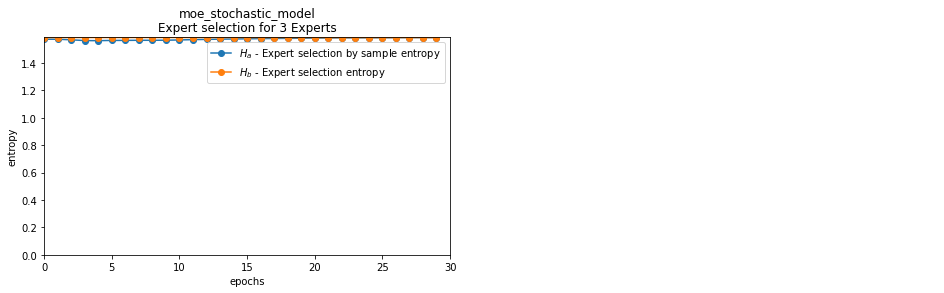

In [60]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):
        plot_file = generate_plot_file(dataset_1,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))
        legend_labels = [r'$H_a$ - Expert selection by sample entropy', r'$H_b$ - Expert selection entropy']
        for m_key, m_val in models.items():
            fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(16,4))
            ax = ax.flatten()


            history = m_val['experts'][i]['history']

            ax[0].plot(range(num_epochs), history['sample_entropy'], marker='o') 
            ax[0].plot(range(num_epochs), history['entropy'], marker='o') 
            ax[0].set_ylim(bottom=0)
            ax[0].set_title(m_key+'\n'+'Expert selection for ' + str(i) + ' Experts')
            ax[0].set_xlabel('epochs')
            ax[0].set_xlim(0, num_epochs)
            ax[0].set_ylabel('entropy')
            ax[0].legend(legend_labels)

            if T> 1:
                ax[1].plot(range(num_epochs), history['entropy_T'], marker='o')
                ax[1].set_title(m_key+'\n'+'Batch entropy for ' + str(i) + ' Experts with high T = '+str(T))
                ax[1].set_xlabel('epochs')
                ax[1].set_xlim(0, num_epochs)
                ax[1].set_ylabel('entropy')
            else:
                ax[1].axis('off')

            image_file = generate_plot_file(dataset_1+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'batch_entropy_'+image_file))
            plt.show()


model:  multi_class_linear_expert_gate_importance_1.0_rand_T_1_6_3_model.pt


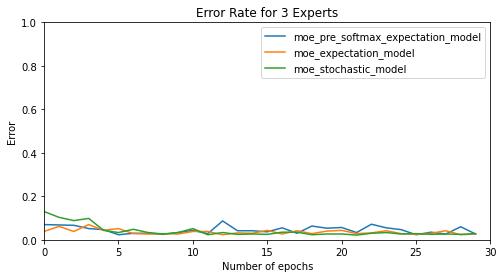

In [61]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
            
    for i in range(total_experts, total_experts+1):
        
        plot_file = generate_plot_file(dataset_1,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))
        fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8,4))
        legend_labels = []

        for m_key, m_val in models.items():
            
            legend_labels.append(m_key)
            history = m_val['experts'][i]['history']
            ax.plot(range(len(history['val_accuracy'])), 1-np.asarray(history['val_accuracy']))

            ax.set_title('Error Rate for ' + str(i) + ' Experts')
            ax.legend(legend_labels)
            ax.set_xlabel('Number of epochs')
            ax.set_xlim(0, num_epochs)
            ax.set_ylim(0, 1.0)
            ax.set_ylabel('Error')

        image_file = generate_plot_file(dataset_1, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
        plt.savefig(os.path.join(fig_path, 'error_rate_'+image_file))

        plt.show()


model:  multi_class_pre_trained_fixed_gate_linear_expert_gate_rand_T_1_6_3_model.pt


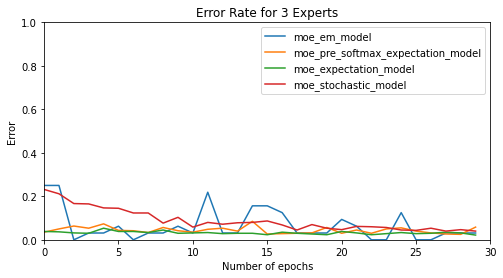

In [58]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
            
    for i in range(total_experts, total_experts+1):
        
        plot_file = generate_plot_file(dataset_3,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))
        fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8,4))
        legend_labels = []

        for m_key, m_val in models.items():
            
            legend_labels.append(m_key)
            history = m_val['experts'][i]['history']
            ax.plot(range(len(history['val_accuracy'])), 1-np.asarray(history['val_accuracy']))

            ax.set_title('Error Rate for ' + str(i) + ' Experts')
            ax.legend(legend_labels)
            ax.set_xlabel('Number of epochs')
            ax.set_xlim(0, num_epochs)
            ax.set_ylim(0, 1.0)
            ax.set_ylabel('Error')

        image_file = generate_plot_file(dataset_3, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
        plt.savefig(os.path.join(fig_path, 'error_rate_'+image_file))

        plt.show()


Mutual information for  moe_pre_softmax_expectation_model


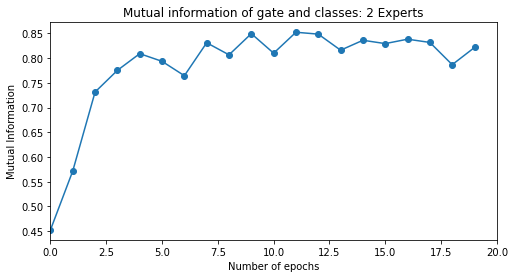

Mutual information for  moe_expectation_model


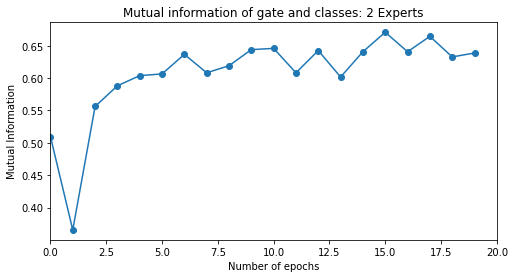

Mutual information for  moe_stochastic_model


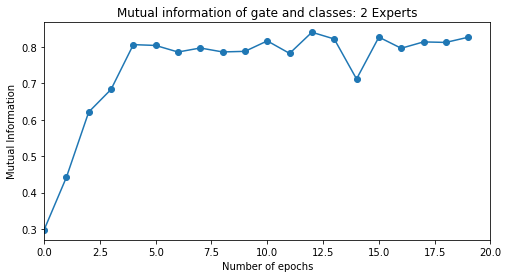

In [44]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    models = torch.load(os.path.join(model_path, plot_file))

    for m_key, m_val in models.items():
        print('Mutual information for ', m_key)
        legend_labels = []
        for i in range(total_experts, total_experts+1):
            history = m_val['experts'][i]['history']

            plt.plot(range(len(history['mutual_EY'])), history['mutual_EY'], marker='o')

            legend_labels.append('E'+str(i))
        plt.title('Mutual information of gate and classes: ' + str(i) + ' Experts')
        plt.xlabel('Number of epochs')
        plt.xlim(0, num_epochs)
        plt.ylabel('Mutual Information')
        image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
        plt.savefig(os.path.join(fig_path, 'mutual_info_'+image_file))

        plt.show()
        

### Visualise decision boundaries of mixture of expert model, expert model and gate model

In [52]:
#create meshgrid
def generate_meshgrid(X):
    resolution = 100 # 100x100 background pixels
    a2d_min, a2d_max = np.min(X[:,0]), np.max(X[:,0])
    b2d_min, b2d_max = np.min(X[:,1]), np.max(X[:,1])
    a, b = np.meshgrid(np.linspace(a2d_min, a2d_max, resolution), 
                       np.linspace(b2d_min, b2d_max, resolution))
    generated_data = torch.tensor(np.c_[a.ravel(), b.ravel()], dtype=torch.float32)
    return generated_data

In [53]:
def labels(p, palette=palette):
    pred_labels = torch.argmax(p, dim=1)
    uniq_y = np.unique(pred_labels)
    pred_color = [palette[i] for i in uniq_y]
    return pred_color, pred_labels

In [54]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def predict(dataloader, model):
        
        pred_labels = []
        true_labels = []
        for i, data in enumerate(dataloader):
            inputs, labels = data
            true_labels.append(labels)
            pred_labels.append(torch.argmax(model(inputs), dim=1))
            
        return torch.stack(true_labels), torch.stack(pred_labels)

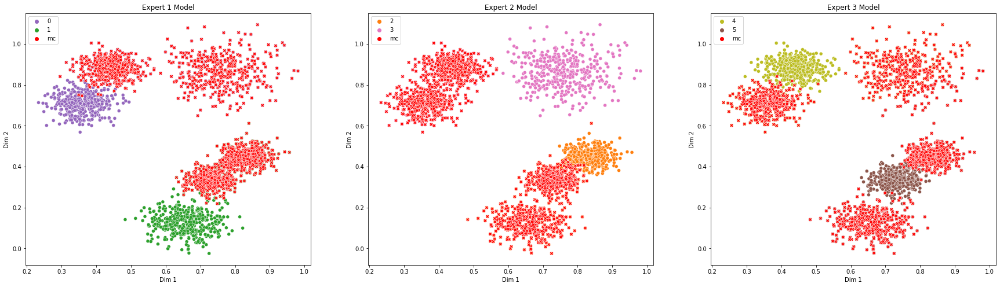

In [47]:
fig,ax = plt.subplots(1, 3, sharex=False, sharey=False, figsize=(30,8))
X_orig_data = trainset[:][0].to(device)
y_orig_data = trainset[:][1].to(device)
for i, expert in enumerate(expert_models):
    orig_data_expert_output = expert(X_orig_data)
    pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(orig_data_expert_output.cpu())
    pred_orig_data_expert_labels = pred_orig_data_expert_labels.to(device)
    sns.scatterplot(x=X_orig_data[:,0].cpu(), y=X_orig_data[:,1].cpu(), hue=pred_orig_data_expert_labels.cpu().numpy(), 
                    palette=pred_orig_data_expert_color, ax=ax[i])
 
    indices = torch.where((pred_orig_data_expert_labels == y_orig_data) == False)[0]
    sns.scatterplot(x=X_orig_data[indices,0].cpu(),y=X_orig_data[indices,1].cpu(),
                    hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax[i])


    ax[i].set_title('Expert '+str(i+1)+' Model')
    ax[i].set_ylabel('Dim 2')
    ax[i].set_xlabel('Dim 1')
image_file = generate_plot_file(dataset, 'T_'+str(T_max)+'_'+str(num_classes)+'_'+str(total_experts)+'_experts.png')
plt.savefig(os.path.join(fig_path, 'pretrained_experts_'+image_file))


In [ ]:
fig,ax = plt.subplots(1, 3, sharex=False, sharey=False, figsize=(30,8))
X_orig_data = trainset[:][0].to(device)
y_orig_data = trainset[:][1].to(device)
for i, expert in enumerate(expert_presoftmax_models):
    orig_data_expert_output = expert(X_orig_data)
    pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(F.softmax(orig_data_expert_output.cpu(), dim=1))
    pred_orig_data_expert_labels = pred_orig_data_expert_labels.to(device)
    sns.scatterplot(x=X_orig_data[:,0].cpu(), y=X_orig_data[:,1].cpu(), hue=pred_orig_data_expert_labels.cpu().numpy(), 
                    palette=pred_orig_data_expert_color, ax=ax[i])
 
    indices = torch.where((pred_orig_data_expert_labels == y_orig_data) == False)[0]
    sns.scatterplot(x=X_orig_data[indices,0].cpu(),y=X_orig_data[indices,1].cpu(),
                    hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax[i])


    ax[i].set_title('Expert '+str(i+1)+' Model')
    ax[i].set_ylabel('Dim 2')
    ax[i].set_xlabel('Dim 1')
image_file = generate_plot_file(dataset, 'T_'+str(T_max)+'_'+str(num_classes)+'_'+str(total_experts)+'_experts.png')
plt.savefig(os.path.join(fig_path, 'pretrained_experts_'+image_file))


In [55]:
def visualize(models, total_experts, num_classes, generated_data, 
              X_orig_data, y_orig_data,filename):
    keys = models.keys()
    print(keys)
    N = len(keys)
    fontsize = 25-((N-1)*5)
    fontsize1 = 20-((N-1)*3)
    labelsize = 20-((N-1)*3)
    legendsize = 18-((N-1)*3)
    
    index = 0
    for m_key, m_val in models.items():

        nrows = 1
        ncols = total_experts + 1

        thefigsize = (ncols*(14-(ncols*2)), nrows*(14-(ncols*2)))
        fig, ax = plt.subplots(nrows, ncols, sharex=False, sharey=True, figsize=thefigsize)

        print('\n',m_key)
        moe_model = m_val['experts'][total_experts]['model']

        pred_orig_data = moe_model(X_orig_data)

        orig_data_gate_outputs = moe_model.gate_outputs
        orig_data_expert_outputs = moe_model.expert_outputs
        if 'stochastic' in m_key:
            orig_data_samples = moe_model.samples

        pred_orig_data_color,pred_orig_data_labels = labels(pred_orig_data.cpu())

        pred_gen_data = moe_model(generated_data)
        pred_gen_data_expert_output = moe_model.expert_outputs

        pred_gen_data_color,pred_gen_data_labels = labels(pred_gen_data.cpu())

        palette_gate = sns.color_palette("Paired")+sns.color_palette('Set2')
        pred_gate_gen_data_output = moe_model.gate_outputs
        pred_gate_gen_data_color, pred_gate_gen_data_labels = labels(pred_gate_gen_data_output.cpu(), palette_gate)
    
        sns.scatterplot(x=generated_data[:,0].cpu(),y=generated_data[:,1].cpu(),
                        hue=pred_gate_gen_data_labels+1, legend=False, palette=pred_gate_gen_data_color, ax=ax[0])
        sns.scatterplot(x=X_orig_data[:,0].cpu() , y=X_orig_data[:,1].cpu() , 
                        hue=pred_orig_data_labels, legend=False, palette=pred_orig_data_color, s=40,ax=ax[0])
        indices = np.where((pred_orig_data_labels == y_orig_data.cpu() )== False)[0]
        sns.scatterplot(x=X_orig_data[indices,0].cpu(),y=X_orig_data[indices,1].cpu(),
                        hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax[0])
        ax[0].set_title(m_key+'\n'+'Mixture of Experts', fontsize=fontsize)
        ax[0].set_ylabel('Dim 2', fontsize=fontsize1)
        ax[0].set_xlabel('Dim 1', fontsize=fontsize1)
        ax[0].tick_params(labelsize=labelsize)

        for i in range(0, total_experts):
            if 'pre_softmax' in m_key:
                pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(F.softmax(orig_data_expert_outputs[:,i,:].cpu(), dim=1))
            else:
                pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(orig_data_expert_outputs[:,i,:].cpu())
            
            index = np.where(pred_gate_gen_data_labels==i)[0]
            color = np.unique(pred_gate_gen_data_labels[index].cpu())
            if len(color) > 0:
                sns.scatterplot(x=generated_data[:,0][index].cpu(),y=generated_data[:,1][index].cpu(),
                            hue=pred_gate_gen_data_labels[index]+1, legend=False, palette=[palette_gate[0:total_experts][color[0]]], ax=ax[i+1])

            sns.scatterplot(x=X_orig_data[:,0].cpu(),y=X_orig_data[:,1].cpu(),
                                hue=pred_orig_data_expert_labels,palette=pred_orig_data_expert_color, legend=False, s=40, ax=ax[i+1])

            pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(F.softmax(orig_data_expert_outputs[:,i,:].cpu(), dim=1))
            indices = np.where((pred_orig_data_expert_labels == y_orig_data.cpu()) == False)[0]
            sns.scatterplot(x=X_orig_data[indices,0].cpu(),y=X_orig_data[indices,1].cpu(),
                            hue=['mc']*len(indices), palette=['r'], legend=False, marker='X', ax=ax[i+1])

            ax[i+1].set_title('Expert '+str(i+1)+' Model', fontsize=fontsize)
            ax[i+1].set_ylabel('Dim 2', fontsize=fontsize1)
            ax[i+1].set_xlabel('Dim 1', fontsize=fontsize1)
            ax[i+1].tick_params(labelsize=labelsize)


#        fig_moe.savefig(filename +'_'+str(e)+'_experts.png')
    plt.show()



In [53]:
def visualize(models, total_experts, num_classes, generated_data, 
              X_orig_data, y_orig_data,filename):
    keys = models.keys()
    print(keys)
    N = len(keys)
    fontsize = 25-((N-1)*5)
    fontsize1 = 20-((N-1)*3)
    labelsize = 20-((N-1)*3)
    legendsize = 18-((N-1)*3)
    for e in range(total_experts, total_experts+1):
        
        print('Number of Experts:', e)
        
        nrows = e
        ncols = N

        thefigsize = (ncols*(14-(ncols*2)),1*(14-(ncols*2)))
        fig_moe,ax = plt.subplots(1, ncols, sharex=False, sharey=True, figsize=thefigsize)
        
              
        thefigsize1 = (ncols*(14-(ncols*2)),nrows*(14-(ncols*2)))
        fig_experts,ax1 = plt.subplots(nrows, ncols, sharex=False, sharey=True, figsize=thefigsize1)
        fig_experts.subplots_adjust(hspace=0.3)
        ax1 = ax1.flatten()  
        
        thefigsize2 = (ncols*(14-(ncols*2)),2*(14-(ncols*2)))
        fig_gate_outputs,ax2 = plt.subplots(2, ncols, sharex=False, sharey=True, figsize=thefigsize2)
        fig_gate_outputs.subplots_adjust(hspace=0.3)
        ax2 = ax2.flatten()
        
        thefigsize3 = (ncols*(12-(ncols*2)),1*(10-(ncols*2)))
        fig_gate_prob,ax3 = plt.subplots(1, ncols, sharex=False, sharey=True, figsize=thefigsize3)       
             
        if ncols > 1:            
            ax = ax.flatten()
            ax3 = ax3.flatten()
        else:
            ax = [ax]
            ax3 = [ax3]
        
        index = 0
        for m_key, m_val in models.items():
            print('\n',m_key)
            moe_model = m_val['experts'][e]['model']
            
            pred_orig_data = moe_model(X_orig_data)
            
            orig_data_gate_outputs = moe_model.gate_outputs
            orig_data_expert_outputs = moe_model.expert_outputs
            if 'stochastic' in m_key:
                orig_data_samples = moe_model.samples
                
            pred_orig_data_color,pred_orig_data_labels = labels(pred_orig_data.cpu())

            pred_gen_data = moe_model(generated_data)
            pred_gen_data_expert_output = moe_model.expert_outputs
                                                        
            pred_gen_data_color,pred_gen_data_labels = labels(pred_gen_data.cpu())

            sns.scatterplot(x=generated_data[:,0].cpu(),y=generated_data[:,1].cpu(),
                            hue=pred_gen_data_labels.cpu(),palette=pred_gen_data_color, legend=False,s=10, ax=ax[index])
            sns.scatterplot(x=X_orig_data[:,0].cpu(), y=X_orig_data[:,1].cpu(), hue=y_orig_data.cpu(), palette=palette[0:num_classes], marker='X', s=40,ax=ax[index])
            indices = np.where((pred_orig_data_labels == y_orig_data.cpu() )== False)[0]
            sns.scatterplot(x=X_orig_data[indices,0].cpu(),y=X_orig_data[indices,1].cpu(),
                            hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax[index])
            plt.setp(ax[index].get_legend().get_texts(), fontsize=legendsize) 
            ax[index].set_title(m_key+'\n'+'Mixture of Experts', fontsize=fontsize)
            ax[index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax[index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax[index].tick_params(labelsize=labelsize)

            for i in range(0, e):
                if 'pre_softmax' in m_key:
                    pred_gen_data_expert_color,pred_gen_data_expert_labels = labels(F.softmax(pred_gen_data_expert_output[:,i,:].cpu(), dim=1))
                else:
                    pred_gen_data_expert_color,pred_gen_data_expert_labels = labels(pred_gen_data_expert_output[:,i,:].cpu())
                
                
                sorted_index = torch.argsort(pred_gen_data_expert_labels)
                sns.scatterplot(x=generated_data[:,0][sorted_index].cpu(),y=generated_data[:,1][sorted_index].cpu(),
                                hue=pred_gen_data_expert_labels[sorted_index],palette=pred_gen_data_expert_color, legend=False, s=10, ax=ax1[(i*N)+index])
                
                sns.scatterplot(x=X_orig_data[:,0].cpu(), y=X_orig_data[:,1].cpu(), hue=y_orig_data.cpu(), palette=palette[0:num_classes], marker='X', s=40, ax=ax1[(i*N)+index])
                
                pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(F.softmax(orig_data_expert_outputs[:,i,:].cpu(), dim=1))
                indices = np.where((pred_orig_data_expert_labels == y_orig_data.cpu()) == False)[0]
                sns.scatterplot(x=X_orig_data[indices,0].cpu(),y=X_orig_data[indices,1].cpu(),
                                hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax1[(i*N)+index])

                plt.setp(ax1[(i*N)+index].get_legend().get_texts(), fontsize=legendsize)
                ax1[(i*N)+index].set_title('Expert '+str(i+1)+' Model', fontsize=fontsize)
                ax1[(i*N)+index].set_ylabel('Dim 2', fontsize=fontsize1)
                ax1[(i*N)+index].set_xlabel('Dim 1', fontsize=fontsize1)
                ax1[(i*N)+index].tick_params(labelsize=labelsize)

            palette_gate = sns.color_palette("Paired")+sns.color_palette('Set2')
            pred_gate_gen_data_output = moe_model.gate_outputs
            pred_gate_gen_data_color, pred_gate_gen_data_labels = labels(pred_gate_gen_data_output.cpu(), palette_gate)

            sns.scatterplot(x=generated_data[:,0].cpu(),y=generated_data[:,1].cpu(),
                            hue=pred_gate_gen_data_labels+1,palette=pred_gate_gen_data_color, legend=False, ax=ax2[index])
            sns.scatterplot(x=X_orig_data[:,0].cpu(), y=X_orig_data[:,1].cpu(), hue=y_orig_data.cpu(), palette=palette[0:num_classes], ax=ax2[index])
            plt.setp(ax2[index].get_legend().get_texts(), fontsize=legendsize)
            ax2[index].set_title('Gate Model Expert Seclection for Data as Decision Boundaries', fontsize=fontsize)
            ax2[index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax2[index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax2[index].tick_params(labelsize=labelsize)
            
            if 'stochastic' in m_key:
                pred_gate_orig_data_labels = orig_data_samples.flatten()
                uniq_y = np.unique(pred_gate_orig_data_labels.cpu())
                pred_gate_orig_data_color = [palette_gate[i] for i in uniq_y]
            else:
                pred_gate_orig_data_color, pred_gate_orig_data_labels = labels(orig_data_gate_outputs.cpu(), palette_gate)
                pred_gate_orig_data_labels = torch.tensor([i.item()+1 for i in pred_gate_orig_data_labels])
                
            sorted_index = torch.argsort(pred_gate_orig_data_labels)
            legend_labels = ['E'+str(l.item()) for l in pred_gate_orig_data_labels[sorted_index]] 
            sns.scatterplot(x=X_orig_data[:,0][sorted_index].cpu(),y=X_orig_data[:,1][sorted_index].cpu(),
                            hue=legend_labels,palette=pred_gate_orig_data_color, ax=ax2[N+index])   
            plt.setp(ax2[N+index].get_legend().get_texts(), fontsize=legendsize)
            ax2[N+index].set_title('Gate Model Expert Seclection for Data', fontsize=fontsize)
            ax2[N+index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax2[N+index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax2[N+index].tick_params(labelsize=labelsize)

            
#             sns.scatterplot(x=X_orig_data[:,0],y=X_orig_data[:,1],
#                             hue=legend_labels,palette=pred_gate_orig_data_color, s=20,ax=ax[((e+3)*N)+index])   
#             indices = np.where((pred_orig_data_labels == y_orig_data )== False)[0]
#             correct_experts = []
#             classes = np.asarray(classes_per_expert)
#             for c in y_orig_data[indices]:
#                 correct_experts.append(np.argwhere(classes == c.item())[0,0])
#             pred_gate_orig_data_color, pred_gate_orig_data_labels = labels (orig_data_gate_outputs[indices], palette_gate)
#             sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
#                             hue=pred_gate_orig_data_labels,palette=pred_gate_orig_data_color,s=80, legend=False, ax=ax[((e+3)*N)+index])
#             sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
#                             hue=correct_experts,palette=palette_gate[0:e],marker='X', s=20, legend=False, ax=ax[((e+3)*N)+index])   
#             sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
#                             hue=['mc']*len(indices), palette=['r'], marker='o', ec="r", fc="none", s=80, ax=ax[((e+3)*N)+index])
#             plt.setp(ax[((e+3)*N)+index].get_legend().get_texts(), fontsize=legendsize)
#             ax[((e+3)*N)+index].set_title('Gate Model Misclassifying Orig Data', fontsize=fontsize)
#             ax[((e+3)*N)+index].set_ylabel('Dim 2', fontsize=fontsize1)
#             ax[((e+3)*N)+index].set_xlabel('Dim 1', fontsize=fontsize1)
#             ax[((e+3)*N)+index].tick_params(labelsize=labelsize)    

            history = m_val['experts'][e]['history']
            gate_prob = np.asarray(history['mean_gate_probability'])
            for i in range(0, total_experts):
                sns.lineplot(x=np.asarray(list(range(0,num_epochs))), y=gate_prob[:,i], marker='o', ax=ax3[index])

            ax3[index].set_title('Average gate probability for ' + str(total_experts), fontsize=fontsize)
            ax3[index].legend(['E'+str(i) for i in range(1, e+1)])
            ax3[index].set_xlabel('Number of epochs', fontsize=fontsize1)
            ax3[index].set_xlim(0,num_epochs)
            ax3[index].set_ylabel('Avg gate probabilitis per expert', fontsize=fontsize1)
            ax3[index].set_ylim(0,1)
            ax3[index].tick_params(labelsize=labelsize)
            
            if T > 1.0:
                fig2,ax2 = plt.subplots(1, ncols, sharex=True, sharey=True, figsize=thefigsize1)

                history = m_val['experts'][e]['history']
                exp_sample_accuracy = np.asarray(history['expert_sample_accuracy_T'])
                for i in range(0, total_experts):
                    sns.lineplot(x=np.asarray(list(range(0,num_epochs))), y=exp_sample_accuracy[:,i], marker='o', ax=ax2)

                ax2.set_title('Accuracy per expert  for '+ str(total_experts)+' experts and T = '+str(T), fontsize=fontsize)
                ax2.legend(['E'+str(i) for i in range(1, e+1)])
                ax2.set_xlabel('Number of epochs', fontsize=fontsize1)
                ax2.set_xlim(0,num_epochs)
                ax2.set_ylabel('Accuracy', fontsize=fontsize1)
                ax2.tick_params(labelsize=labelsize)
                
                fig2.savefig(filename +'_sample_'+str(e)+'_experts.png')
            
            
            index += 1
            
        fig_moe.savefig(filename +'_'+str(e)+'_experts.png')
        fig_experts.savefig(filename +'_expert_outputs_'+str(e)+'_experts.png')
        fig_gate_prob.savefig(filename +'_gate_prob_'+str(e)+'_experts.png')
        fig_gate_outputs.savefig(filename +'_gate_outputs_'+str(e)+'_experts.png')
        plt.show()
    


Temperature  1
multi_class_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_linear_expert_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_em_model', 'moe_pre_softmax_expectation_model', 'moe_expectation_model', 'moe_stochastic_model'])

 moe_em_model

 moe_pre_softmax_expectation_model

 moe_expectation_model

 moe_stochastic_model


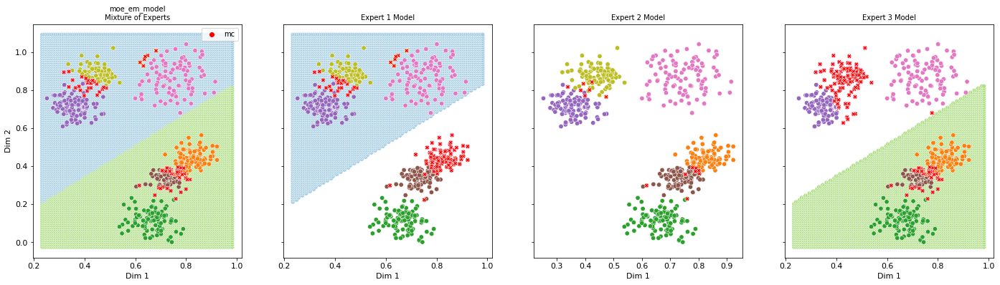

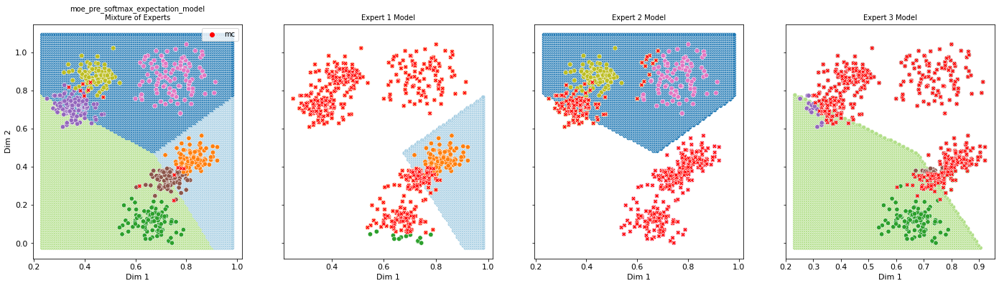

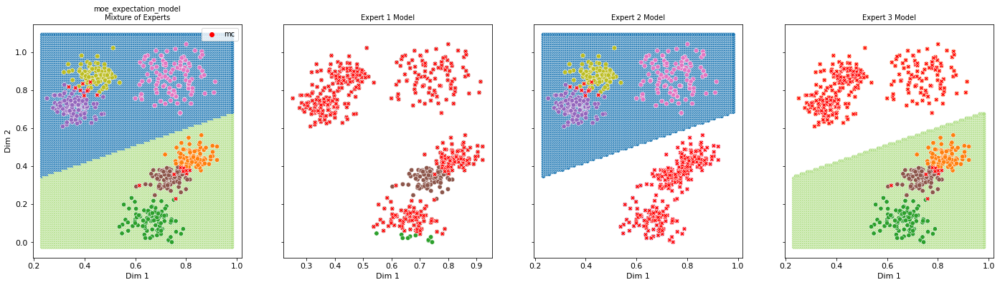

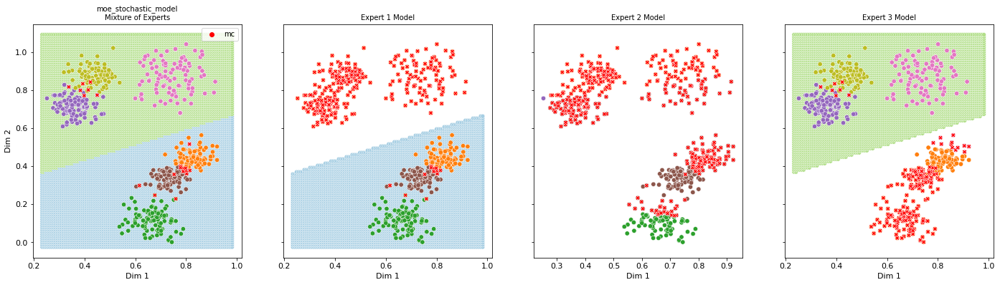

In [56]:
generated_data = generate_meshgrid(X).to(device)
for T in range(1, T_max+1):
    print('Temperature ', T)
    plot_file = generate_plot_file(dataset_1, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    models = torch.load(os.path.join(model_path, plot_file))
    print(plot_file)

    image_file = generate_plot_file(dataset_1, 'T_'+str(T)+'_'+str(num_classes)+'_'+classes_per_expert_str+'_test')
    filename = os.path.join(fig_path, image_file)
    print(filename)
    visualize(models, total_experts, num_classes, generated_data, testset[:][0].to(device), testset[:][1].to(device), filename)
    

Temperature  1
multi_class_scratch_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_scratch_linear_expert_gate_rand_T_1_6_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


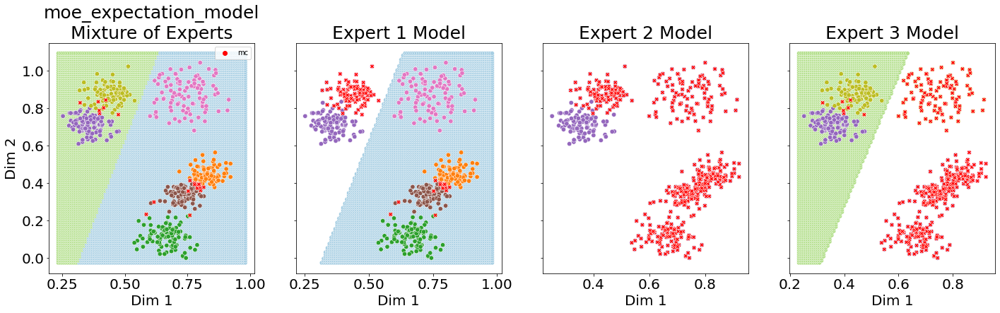

Temperature  1
multi_class_pre_trained_gate_scratch_same_wts_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_scratch_same_wts_linear_expert_gate_rand_T_1_6_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


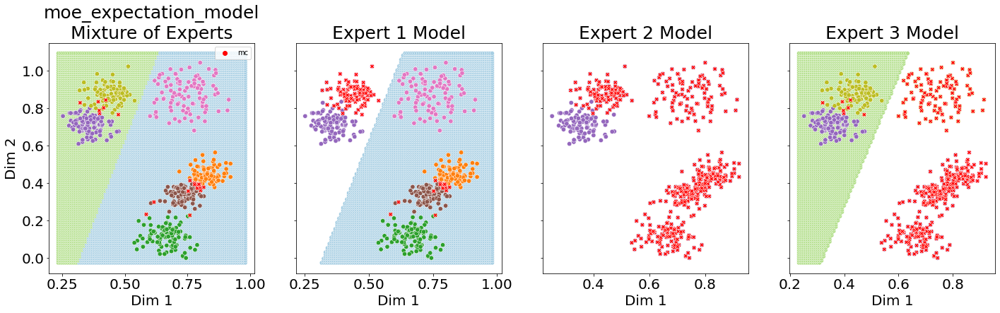

Temperature  1
multi_class_pre_trained_gate_scratch_rand_wts_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_scratch_rand_wts_linear_expert_gate_rand_T_1_6_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


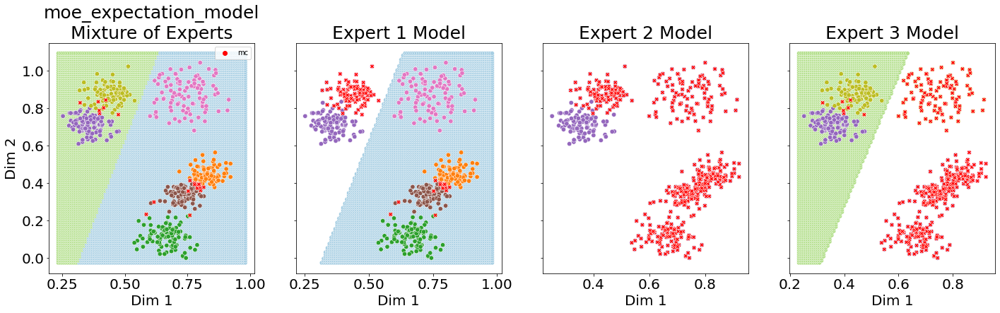

In [59]:
generated_data = generate_meshgrid(X).to(device)
datasets = [dataset_2, dataset_3, dataset_4]
for ds in datasets:
    for T in range(1, T_max+1):
        print('Temperature ', T)
        plot_file = generate_plot_file(ds, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        print(plot_file)

        image_file = generate_plot_file(ds, 'T_'+str(T)+'_'+str(num_classes)+'_test')
        filename = os.path.join(fig_path, image_file)
        print(filename)
        visualize(models, total_experts, num_classes, generated_data, 
                    testset[:][0].to(device), testset[:][1].to(device), filename)

Temperature  1
multi_class_scratch_linear_expert_nonlinear_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_scratch_linear_expert_nonlinear_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


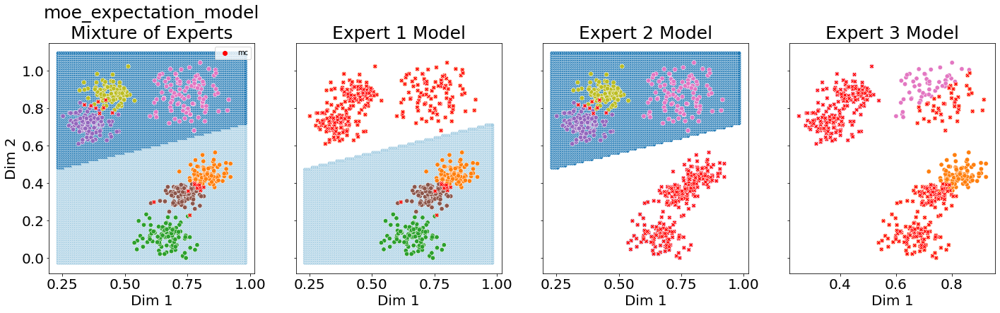

Temperature  1
multi_class_pre_trained_gate_scratch_same_wts_linear_expert_nonlinear_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_scratch_same_wts_linear_expert_nonlinear_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


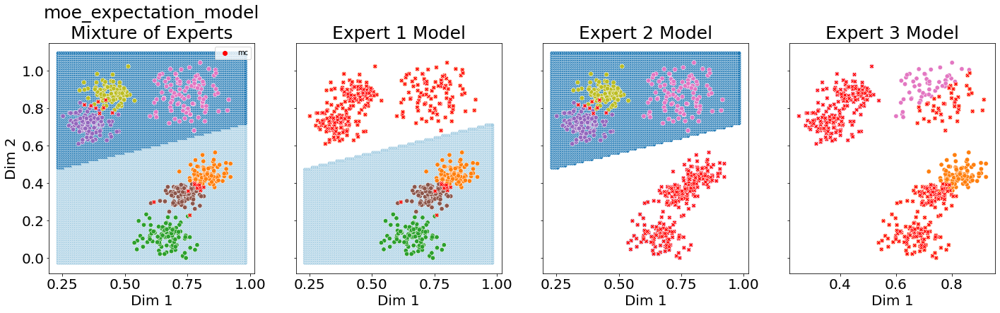

Temperature  1
multi_class_pre_trained_gate_scratch_rand_wts_linear_expert_nonlinear_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_scratch_rand_wts_linear_expert_nonlinear_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


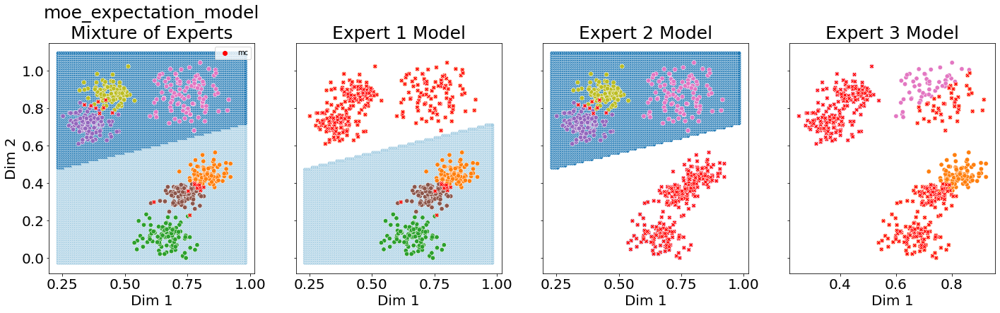

In [65]:
generated_data = generate_meshgrid(X).to(device)
datasets = [dataset_5, dataset_6, dataset_7]
for ds in datasets:
    for T in range(1, T_max+1):
        print('Temperature ', T)
        plot_file = generate_plot_file(ds, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        print(plot_file)

        image_file = generate_plot_file(ds, 'T_'+str(T)+'_'+str(num_classes)+'_'+classes_per_expert_str+'_test')
        filename = os.path.join(fig_path, image_file)
        print(filename)
        visualize(models, total_experts, num_classes, generated_data, testset[:][0].to(device), testset[:][1].to(device), filename)


Temperature  1
multi_class_pre_trained_gate_prechosen_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_prechosen_linear_expert_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


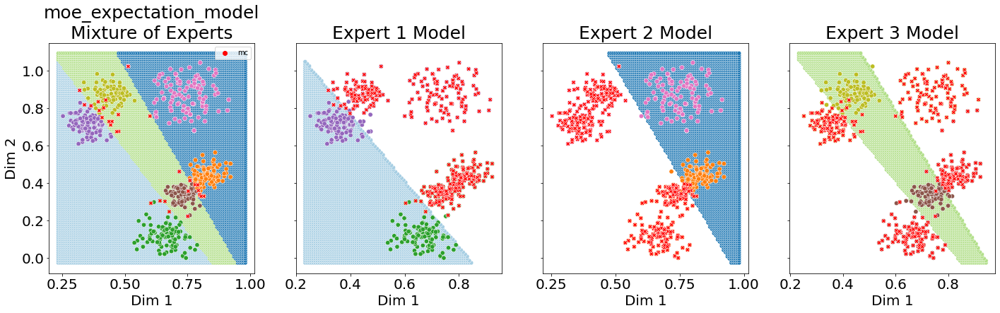

Temperature  1
multi_class_pre_trained_gate_prechosen_same_wts_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_prechosen_same_wts_linear_expert_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


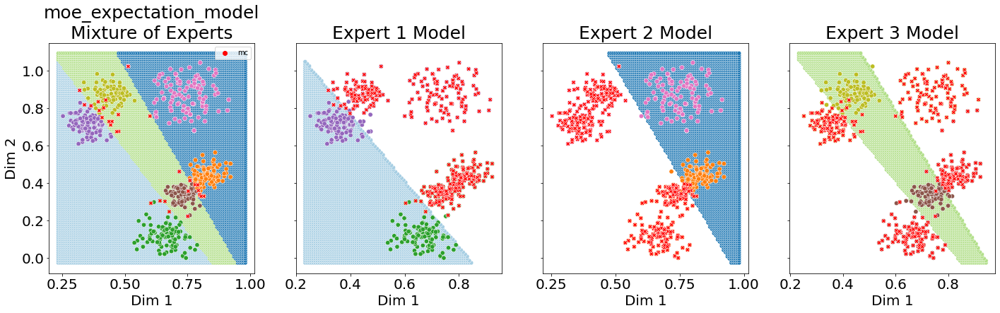

Temperature  1
multi_class_pre_trained_gate_prechosen_rand_wts_linear_expert_gate_rand_T_1_6_3_model.pt
nips2021/figures/multi_class_pre_trained_gate_prechosen_rand_wts_linear_expert_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_expectation_model'])

 moe_expectation_model


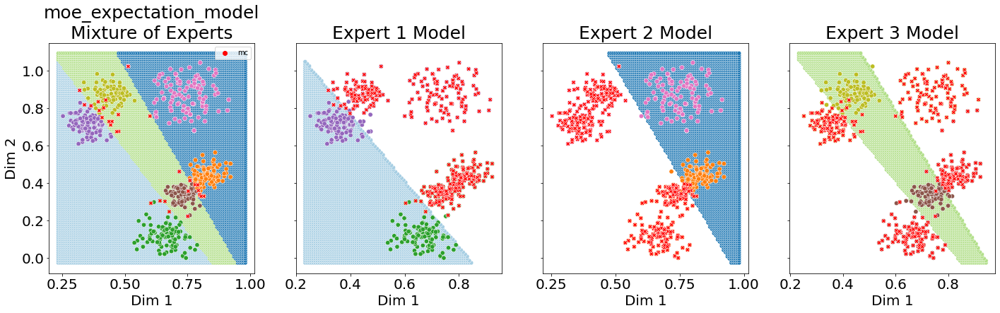

In [58]:
generated_data = generate_meshgrid(X).to(device)
datasets = [dataset_8, dataset_9, dataset_10]
for ds in datasets:
    for T in range(1, T_max+1):
        print('Temperature ', T)
        plot_file = generate_plot_file(ds, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        print(plot_file)

        image_file = generate_plot_file(ds, 'T_'+str(T)+'_'+str(num_classes)+'_'+classes_per_expert_str+'_test')
        filename = os.path.join(fig_path, image_file)
        print(filename)
        visualize(models, total_experts, num_classes, generated_data, testset[:][0].to(device), testset[:][1].to(device), filename)


Temperature  1
multi_class_pre_trained_random_gate_linear_expert_nonlinear_gate_rand_T_1_6_3_model.pt
/Users/peac004/modular_learning_research/papers/neurips_xai_workshop_2021/figures/multi_class_pre_trained_random_gate_linear_expert_nonlinear_gate_rand_T_1_6_01_23_45_test
dict_keys(['moe_em_model', 'moe_pre_softmax_expectation_model', 'moe_expectation_model', 'moe_stochastic_model'])
Number of Experts: 3

 moe_em_model

 moe_pre_softmax_expectation_model

 moe_expectation_model

 moe_stochastic_model


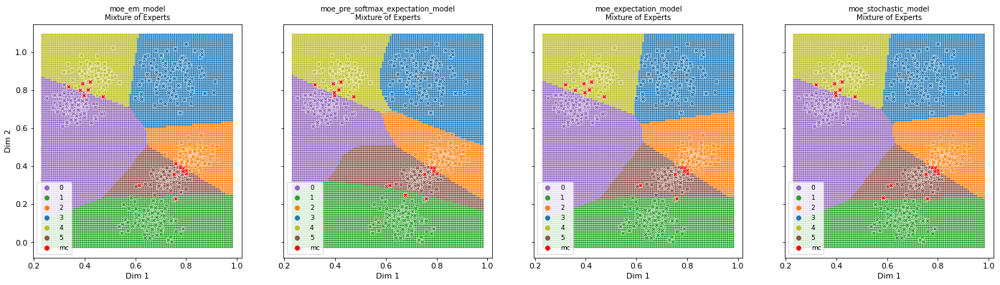

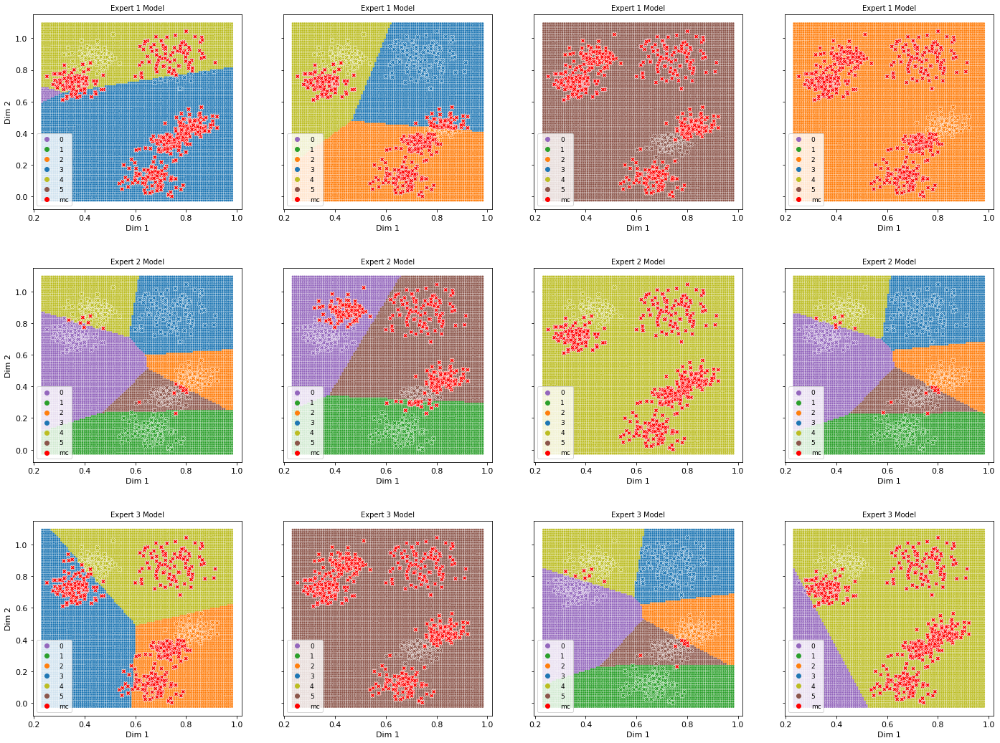

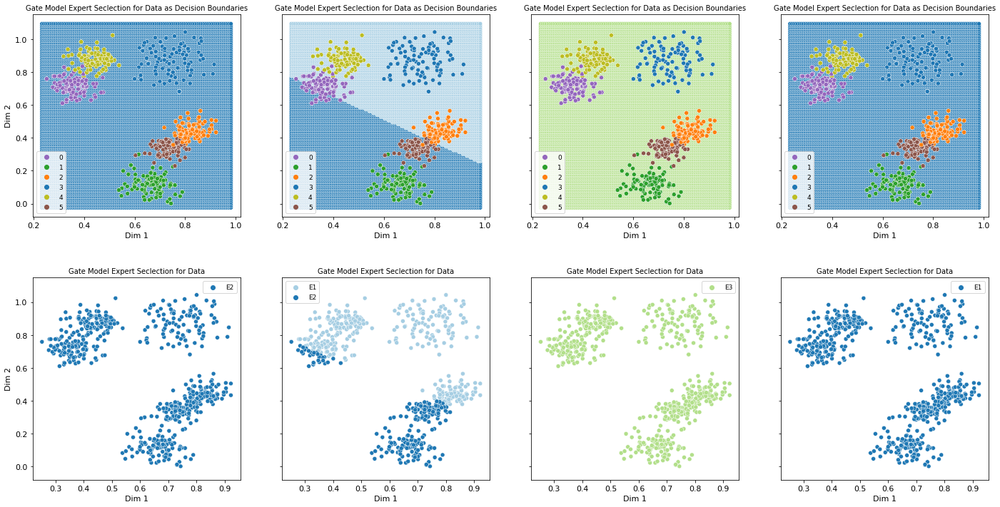

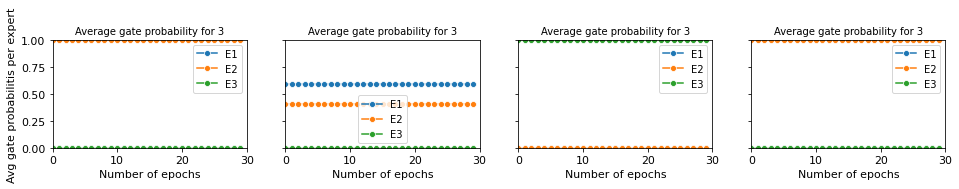

In [55]:
generated_data = generate_meshgrid(X)
for T in range(1, T_max+1):
    print('Temperature ', T)
    plot_file = generate_plot_file(dataset_2, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    models = torch.load(os.path.join(model_path, plot_file))
    print(plot_file)

    image_file = generate_plot_file(dataset_2, 'T_'+str(T)+'_'+str(num_classes)+'_'+classes_per_expert_str+'_test')
    filename = os.path.join(fig_path, image_file)
    print(filename)
    visualize(models, total_experts, num_classes, generated_data, testset[:][0], testset[:][1], filename)
    

Model: moe_pre_softmax_expectation_model
Number of Experts: 3


NameError: name 'colors' is not defined

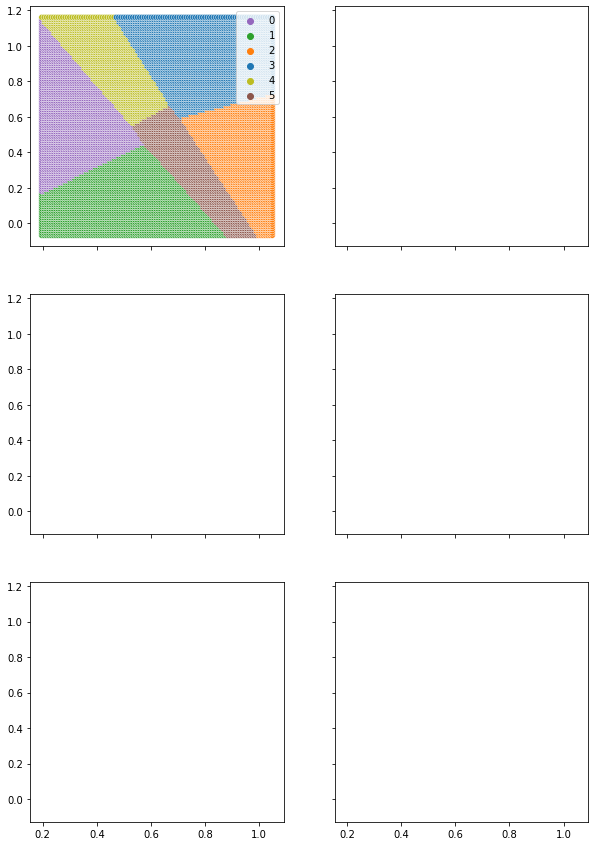

In [101]:
for m_key, m_val in models.items():
    print('Model:', key)
    for e_key, e_val in m_val['experts'].items():
        print('Number of Experts:', e_key)
        moe_model = e_val['model']
    
        pred = moe_model(generated_data)
        pred_color,pred_labels = labels(pred)

        pred_gate = moe_model.gate(generated_data)
        pred_gate_color, pred_gate_labels = labels(pred_gate, ['b','y','m','k'])


        experts = moe_model.experts
        num_experts = e_key
        
        nrows = ceil(((2 + num_experts)/2.0))
        ncols = 2
        thefigsize = (ncols*5,nrows*5)
        fig,ax = plt.subplots(nrows, ncols, sharex=True, sharey=True, figsize=thefigsize)
        ax = ax.flatten()
        sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                        hue=pred_labels,palette=pred_color, ax=ax[0])
        for i in range(0, num_classes):
            ax[0].scatter(X[y==i, 0], X[y==i,1], color=colors[i])
        ax[0].set_title('Mixture of Experts')
        ax[0].set_ylabel('Dim 2')
        ax[0].set_xlabel('Dim 1')
        
        for i in range(0, num_experts):
            pred = experts[i](generated_data)
            pred_color,pred_labels = labels(pred)
            sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                            hue=pred_labels,palette=pred_color, ax=ax[i+1])
            for j in range(0, num_classes):
                ax[i+1].scatter(X[y==j, 0], X[y==j,1], color=colors[j])
            ax[i+1].set_title('Expert '+str(i+1)+' Model')
            ax[i+1].set_ylabel('Dim 2')
            ax[i+1].set_xlabel('Dim 1')
    
        sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                    hue=pred_gate_labels,palette=pred_gate_color, ax=ax[num_experts+1])
        for i in range(0, num_classes):
            ax[num_experts+1].scatter(X[y==i, 0], X[y==i,1], color=colors[i])
        ax[num_experts+1].set_title('Gate Model')
        ax[num_experts+1].set_ylabel('Dim 2')
        ax[num_experts+1].set_xlabel('Dim 1')
        
        if (num_experts%2) == 1:
            ax[-1].axis('off')

#         plt.savefig('figures/all/'+m_key+'_'+str(num_classes)+'_'+str(e_key)+'_expert.png')

        plt.show()

        pred_gate = moe_model.gate(trainset[:][0])
        pred_gate_color, pred_gate_labels = labels(pred_gate, ['b','y','m','k'])

        fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(10,5))
        sns.scatterplot(x=trainset[:][0][:,0],y=trainset[:][0][:,1],
                        hue=pred_gate_labels,palette=pred_gate_color, ax=ax)
        
#         plt.savefig('figures/all/'+m_key+'_'+str(num_classes)+'_'+str(e_key)+'_expert_selected.png')
        plt.show()
        
        cmap = sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
        fig,ax = plt.subplots(num_experts, 1, sharex=True, sharey=True, figsize=thefigsize)
        if num_experts > 1:
            ax = ax.flatten()

        with torch.no_grad():
            for i, expert in enumerate(experts, 0):
                labels_true, labels_pred = predict(testloader, expert)
                labels_pred_np = labels_pred.numpy().flatten()
                labels_true_np = labels_true.numpy().flatten()
                if num_experts > 1:
                    sns.heatmap(confusion_matrix(labels_true_np, labels_pred_np), annot=True, ax=ax[i], cmap=cmap)
                    ax[i].set_title('Confusion Matrix: Expert '+str(i)+' Model')
                else:
                    sns.heatmap(confusion_matrix(labels_true_np, labels_pred_np), annot=True, ax=ax, cmap=cmap)
                    ax.set_title('Confusion Matrix: Expert '+str(i)+' Model')
        
        plt.savefig('figures/all/'+m_key+'_'+str(num_classes)+'_'+str(e_key)+'_expert_cm.png')

        plt.show()

In [ ]:
# for m_key, m_val in models.items():
single_model_simple = nn.Sequential(                   
#                         nn.Linear(2, 2),
#                         nn.ReLU(),
                        nn.Linear(2,num_classes),
                        nn.Softmax(dim=1)
                    )        

In [ ]:
single_model_complex = nn.Sequential(
                    nn.Linear(2, (total_experts+1)*8),
                    nn.ReLU(),
                    nn.Linear((total_experts+1)*8, (total_experts+1)*8),
                    nn.ReLU(),
                    nn.Linear((total_experts+1)*8, (total_experts+1)*4),
                    nn.ReLU(),
                    nn.Linear((total_experts+1)*4,num_classes),
                    nn.Softmax(dim=1)
                )        

In [ ]:
single_model = single_model_complex

In [ ]:
single_model = single_model_simple

In [ ]:
params = [p.numel() for p in single_model.parameters() if p.requires_grad]
print(params, sum(params))

In [ ]:
single_model_optimizer = optim.RMSprop(single_model.parameters(),
                                      lr=0.001, momentum=0.9)

In [ ]:
single_model_history = {'loss':[], 'accuracy':[], 'val_accuracy':[]}
for epoch in range(0, num_epochs):
    running_loss = 0.0
    training_accuracy = 0.0
    test_accuracy = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        single_model_optimizer.zero_grad()

        # forward + backward + optimize
        outputs = single_model(inputs)
        loss = cross_entropy_loss(outputs, labels)
        loss.backward()
        single_model_optimizer.step()
        
        running_loss += loss.item()
        training_accuracy += accuracy(outputs, labels)
        
    for j, test_data in enumerate(testloader, 0):
        test_input, test_labels = test_data
        test_outputs = single_model(test_input)
        test_accuracy += accuracy(test_outputs, test_labels)
    single_model_history['loss'].append(running_loss/(i+1))
    single_model_history['accuracy'].append(training_accuracy/(i+1))
    single_model_history['val_accuracy'].append(test_accuracy/(j+1))
    print('epoch: %d loss: %.2f training accuracy: %.2f val accuracy: %.2f' %
            (epoch + 1, running_loss / (i+1), training_accuracy/(i+1), test_accuracy/(j+1)))

print('Finished Training')

In [ ]:
fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8,8))
generated_data = generate_meshgrid(X)
pred = single_model(generated_data)
pred_color,pred_labels = labels(pred)
sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                hue=pred_labels,palette=pred_color, legend=False, ax=ax)

X_orig_data = trainset[:][0]
y_orig_data = trainset[:][1]

sns.scatterplot(x=X_orig_data[:,0], y=X_orig_data[:,1], hue=np.asarray(y_orig_data), palette=palette[0:num_classes], marker='X', s=40, ax=ax)

pred_orig_data = single_model(X_orig_data)
pred_orig_data_color,pred_orig_data_labels = labels(pred_orig_data)
indices = np.where((pred_orig_data_labels == y_orig_data) == False)[0]
sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
                                hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax)

ax.set_title('Mixture of Experts')
ax.set_ylabel('Dim 2')
ax.set_xlabel('Dim 1')

In [ ]:
for i in range(1, total_experts+1):
    legend_labels = []
    for m_key, m_val in models.items():
        history = m_val['experts'][i]['history']
        plt.plot(range(len(history['loss'])), history['loss'])
        legend_labels.append(m_key)
    plt.plot(range(len(single_model_history['loss'])), single_model_history['loss'])
    legend_labels.append('single_model')
    plt.title('Loss: ' + str(i) + ' Experts')
    plt.legend(legend_labels)
    plt.xlabel('Number of epochs')
    plt.xlim(0, num_epochs)
    plt.ylabel('Loss')
    plt.ylim(0, 1)
    plt.savefig('figures/all/loss_'+dataset+'_'+ str(num_classes)+'_'+str(i)+'_experts.png')
    plt.show()

In [ ]:
for i in range(1, total_experts+1):
    legend_labels = []
    for m_key, m_val in models.items():
        history = m_val['experts'][i]['history']
        plt.plot(range(len(history['accuracy'])), history['accuracy'])
        legend_labels.append(m_key)
    plt.plot(range(len(single_model_history['accuracy'])), single_model_history['accuracy'])
    legend_labels.append('single_model')
    plt.title('Accuracy: ' + str(i) + ' Experts')
    plt.legend(legend_labels)
    plt.xlabel('Number of epochs')
    plt.xlim(0, num_epochs)
    plt.ylabel('Training Accuracy')
    plt.ylim(0, 1)
    plt.savefig('figures/all/accuracy_'+dataset+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
    plt.show()